In [17]:
import nltk
import pandas as pd
import seaborn as sns
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
import matplotlib.pyplot as plt
from collections import Counter
import koko
import numpy as np
import re
from nltk.corpus import stopwords 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
import csv


In [78]:
nltk.download("stopwords")
# To download stopwords (these are the words that are needed to be be filtered out before the final processing)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mayan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [19]:
cleaned=pd.read_csv('cleaned_hm.csv')
demographic=pd.read_csv('demographic.csv')

In [20]:
cleaned.head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection
2,27675,1936,24h,I went to the gym this morning and did yoga.,I went to the gym this morning and did yoga.,True,1,NaN,exercise
3,27676,206,24h,We had a serious talk with some friends of our...,We had a serious talk with some friends of our...,True,2,bonding,bonding
4,27677,6227,24h,I went with grandchildren to butterfly display...,I went with grandchildren to butterfly display...,True,1,NaN,affection


In [21]:
cleaned["predicted_category"].value_counts()  #

affection           34168
achievement         33993
enjoy_the_moment    11144
bonding             10727
leisure              7458
nature               1843
exercise             1202
Name: predicted_category, dtype: int64

In [22]:
cleaned.loc[cleaned["reflection_period"]=='3m'].head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
30455,58297,888,3m,nowing im going to travel to china soon,nowing im going to travel to china soon,True,1,leisure,leisure
30456,58298,129,3m,I ate a really good dinner.,I ate a really good dinner.,True,1,NaN,enjoy_the_moment
30457,58299,1354,3m,I went to a Lehigh Valley phantoms hockey game.,I went to a Lehigh Valley phantoms hockey game.,True,1,NaN,leisure
30458,58300,384,3m,I saw the woman I love.,I saw the woman I love.,True,1,NaN,affection
30459,58301,1111,3m,the babyset i ordered finally came and i set i...,the baby set i ordered finally came and i set ...,False,1,NaN,achievement


In [23]:
df_hm = cleaned[cleaned['cleaned_hm'].notnull()]

In [24]:
cleaned.head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection
2,27675,1936,24h,I went to the gym this morning and did yoga.,I went to the gym this morning and did yoga.,True,1,NaN,exercise
3,27676,206,24h,We had a serious talk with some friends of our...,We had a serious talk with some friends of our...,True,2,bonding,bonding
4,27677,6227,24h,I went with grandchildren to butterfly display...,I went with grandchildren to butterfly display...,True,1,NaN,affection


In [25]:
df_hm.head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection
2,27675,1936,24h,I went to the gym this morning and did yoga.,I went to the gym this morning and did yoga.,True,1,NaN,exercise
3,27676,206,24h,We had a serious talk with some friends of our...,We had a serious talk with some friends of our...,True,2,bonding,bonding
4,27677,6227,24h,I went with grandchildren to butterfly display...,I went with grandchildren to butterfly display...,True,1,NaN,affection


In [26]:
len_count = df_hm['cleaned_hm'].apply(lambda x: len(x.split()))

In [27]:
len_count.describe()

count    100535.000000
mean         18.298503
std          21.474146
min           2.000000
25%           9.000000
50%          14.000000
75%          21.000000
max        1179.000000
Name: cleaned_hm, dtype: float64

In [28]:
cleaned[cleaned['cleaned_hm'].apply(lambda x: len(x.split()))==2].head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
1100,28775,634,24h,Shooting guns.,Shooting guns.,True,1,NaN,leisure
4903,32612,7012,24h,My kids.,My kids.,True,1,NaN,affection
7646,35375,2082,24h,"dude, weed","dude, weed",True,1,NaN,enjoy_the_moment
12496,40246,755,24h,watching ncis.,watching ncis.,True,1,NaN,leisure
14868,42633,10831,24h,Donated blood.,Donated blood.,True,1,NaN,achievement


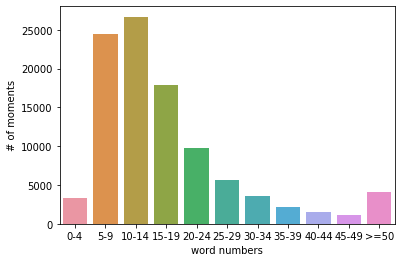

In [29]:
length_order = ["0-4", "5-9", "10-14", "15-19", "20-24", "25-29", "30-34", "35-39","40-44", "45-49", ">=50"]
length_category = len_count.apply(lambda x: length_order[min(10, int(x/5))])
length_counts = pd.DataFrame(length_category.value_counts()).reset_index()
length_counts.columns = ['word numbers', '# of moments']
sns.barplot(x='word numbers', y='# of moments', data=length_counts, order=length_order)

In [30]:
text = ' '.join(df_hm['cleaned_hm'].tolist())
text = text.lower()
wordcloud = WordCloud(background_color="white", height=2700, width=3600).generate(text)

In [31]:
text.replace(".","")
# text.replace(",","")
words=text.split(" ")
ser=pd.Series(words) 

In [32]:
ser.value_counts()

i            103435
my            73829
a             71365
to            56855
and           56472
              ...  
germain)          1
shimmered         1
pilgrimed         1
shakur's          1
'cold'            1
Length: 49700, dtype: int64

In [33]:
# ser.value_counts()

In [34]:
text

'i went on a successful date with someone i felt sympathy and connection with. i was happy when my son got 90% marks in his examination  i went to the gym this morning and did yoga. we had a serious talk with some friends of ours who have been flaky lately. they understood and we had a good evening hanging out. i went with grandchildren to butterfly display at crohn conservatory\r\n i meditated last night. i made a new recipe for peasant bread, and it came out spectacular! i got gift from my elder brother which was really surprising me yesterday my moms birthday so i enjoyed watching cupcake wars with my three teen children i came in 3rd place in my call of duty video game. i completed my 5 miles run without break. it makes me feel strong. went to movies with my friends it was fun  i was shorting gold and made $200 from the trade. hearing songs it can be nearly impossible to go from angry to happy, so you\'re just looking for the thought that eases you out of your angry feeling and mov

(-0.5, 3599.5, 2699.5, -0.5)

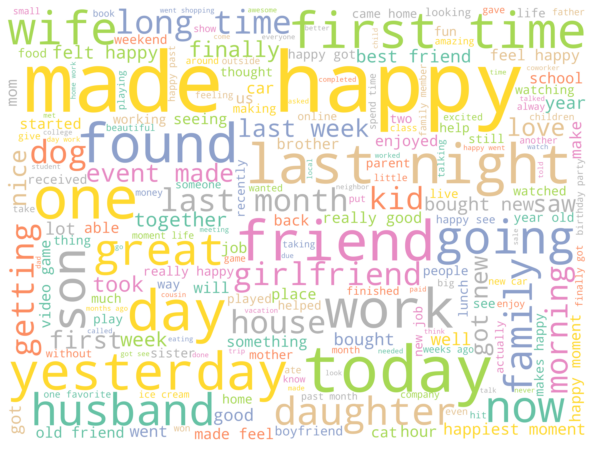

In [35]:
#BEFORE REMOVING STOP WORDS
plt.figure( figsize=(14,8) )
plt.imshow(wordcloud.recolor(colormap=plt.get_cmap('Set2')), interpolation='bilinear')
plt.axis("off")

In [36]:
LIMIT_WORDS = ['happy', 'day', 'got', 'went', 'today', 'made', 'one', 'two', 'time', 'last', 'first', 'going', 'getting', 'took', 'found', 'lot', 'really', 'saw', 'see', 'month', 'week', 'day', 'yesterday', 'year', 'ago', 'now', 'still', 'since', 'something', 'great', 'good', 'long', 'thing', 'toi', 'without', 'yesteri', '2s', 'toand', 'ing']

In [37]:
#Removing words with the above postfix and prefix
text = ' '.join(df_hm['cleaned_hm'].tolist())
text = text.lower()
for w in LIMIT_WORDS:
    text = text.replace(' ' + w, '')
    text = text.replace(w + ' ', '')

In [38]:
wordcloud = WordCloud(stopwords=STOPWORDS,background_color="white", height=2700, width=3600).generate(text)


In [62]:
wordcloud

(-0.5, 3599.5, 2699.5, -0.5)

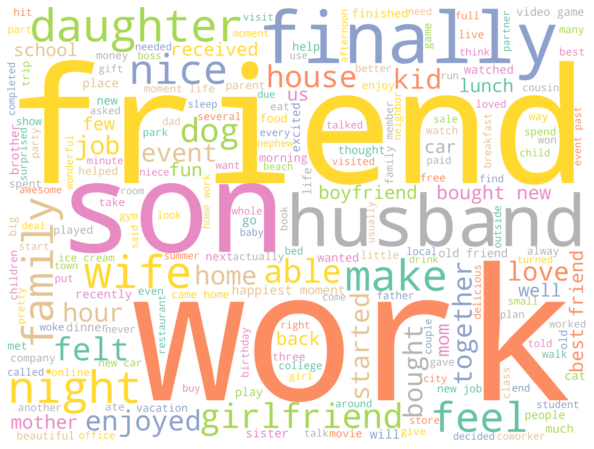

In [39]:
#AFTER removing stop words
plt.figure( figsize=(14,8) )
plt.imshow(wordcloud.recolor(colormap=plt.get_cmap('Set2')), interpolation='bilinear')
plt.axis("off")

(-0.5, 3599.5, 2699.5, -0.5)

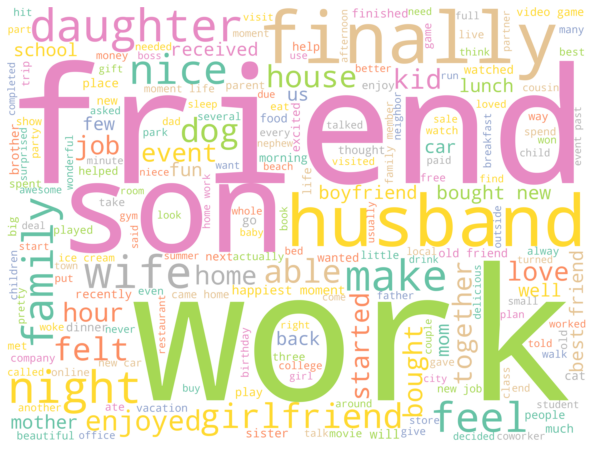

In [40]:
# #after removing stop words
# plt.figure( figsize=(14,8) )
# plt.imshow(wordcloud.recolor(colormap=plt.get_cmap('Set2')), interpolation='bilinear')
# plt.axis("off")

In [41]:
counted_words = Counter(text.split(" "))

In [66]:
counted_words

Counter({'i': 100619,
         'on': 13693,
         'a': 64899,
         'successful': 169,
         'date': 564,
         'with': 19469,
         'somei': 65,
         'felt': 2698,
         'sympathy': 3,
         'and': 52242,
         'connection': 36,
         'with.': 140,
         'was': 32699,
         'when': 9911,
         'my': 69760,
         'son': 2872,
         '90%': 10,
         'marks': 99,
         'in': 23532,
         'his': 3394,
         'examination': 66,
         '': 24786,
         'to': 53268,
         'the': 47708,
         'gym': 364,
         'this': 6290,
         'mornand': 278,
         'did': 1614,
         'yoga.': 10,
         'we': 10206,
         'had': 12494,
         'serious': 59,
         'talk': 632,
         'some': 5363,
         'friends': 3266,
         'of': 24117,
         'ours': 20,
         'who': 1953,
         'have': 6590,
         'been': 4462,
         'flaky': 1,
         'lately.': 53,
         'they': 3084,
         'understo

In [42]:
stopwords=list(STOPWORDS)

In [43]:
words_split=text.split(" ")
final_words=[]
for i in words_split:
    if (i not in stopwords):
        final_words.append(i)


In [44]:
#Countng the occurences of words
counted_words = Counter(final_words)

In [45]:
counted_words.most_common()

[('', 24786),
 ('new', 8526),
 ('work', 5209),
 ('friend', 4859),
 ('able', 4671),
 ('me.', 3981),
 ('family', 3487),
 ('friends', 3266),
 ('finally', 3181),
 ('came', 2996),
 ('home', 2969),
 ('bought', 2881),
 ('son', 2872),
 ('favorite', 2813),
 ('go', 2798),
 ('felt', 2698),
 ('old', 2679),
 ('daughter', 2678),
 ('nice', 2555),
 ('dinner', 2389),
 ('moment', 2367),
 ('husband', 2353),
 ('wife', 2306),
 ('received', 2219),
 ('job', 2200),
 ('feel', 2192),
 ('back', 2003),
 ('event', 1983),
 ('will', 1924),
 ('work.', 1922),
 ('night', 1884),
 ('watched', 1834),
 ('gave', 1821),
 ('game', 1814),
 ('best', 1761),
 ('dog', 1740),
 ('started', 1721),
 ('it.', 1719),
 ('enjoyed', 1699),
 ('much', 1681),
 ('make', 1674),
 ('won', 1670),
 ('life', 1659),
 ('a.', 1539),
 ('told', 1531),
 ('ate', 1507),
 ('finished', 1500),
 ('school', 1497),
 ('car', 1491),
 ('love', 1491),
 ('past', 1460),
 ('girlfriend', 1450),
 ('house', 1413),
 ('big', 1342),
 ('money', 1333),
 ('played', 1325),
 ('movi

In [46]:
#Analysing which season makes people happy
seasons = ['Spring', 'Summer', 'Fall', 'Winter',"Autumn"]


In [47]:
season_dic = dict((x,0) for x in seasons)

In [48]:
season_dic

{'Spring': 0, 'Summer': 0, 'Fall': 0, 'Winter': 0, 'Autumn': 0}

<BarContainer object of 5 artists>

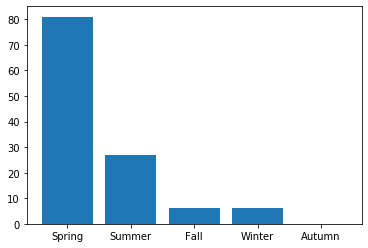

In [119]:
keys = season_dic.keys()
values = season_dic.values()

plt.bar(keys, values)

In [49]:
tokens_hm = cleaned['cleaned_hm'].apply(lambda x: x.split())

In [50]:
for _, value in tokens_hm.iteritems():
    for word in value:
        if word in seasons:
            season_dic[word] += 1

In [51]:
season_dic

{'Spring': 81, 'Summer': 27, 'Fall': 6, 'Winter': 6, 'Autumn': 0}

In [52]:
cleaned.shape

(100535, 9)

In [53]:
# Read the happyDB sample file and writing the text

with open('happydb.txt', 'w') as ofile:
    len = int(cleaned.shape[0] / 10)
    for i in range(0, len - 1):
        ofile.write(cleaned['cleaned_hm'].iloc[i] + '\n')

In [54]:
# I used koko here to extract entities from the text
# Text is given as the input and it will extract noun phrase 'x' preceded by the words "buy" and "purchase" 
# The weight given represents the importance

with open('purchase_v1.koko', 'r') as file:
    print(file.read())

extract "NPs" x from "happydb.txt" if
	("buy" x {0.1}) or
	("purchase" x {0.1})	
with threshold 0.0



In [55]:
import koko
import spacy


In [56]:
# spacy.util.set_data_path('D:/anaconda3/Lib/site-packages/spacy/data/en_core_web_sm')

In [57]:
nlp=spacy.load('en_core_web_sm')
nlp.max_length = 1300000

In [58]:

# Result with threshold set =0
koko.run('purchase_v1.koko',doc_parser='spacy')

Parsed query: extract "happydb.txt" NPs from "x" if
	("buy" x { 0.10 }) or
	("purchase" x { 0.10 })   
with threshold 0.00

C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Exercise
C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Location

Results:

Entity name                    Entity count         Entity score
me                             3                    0.300000
a car                          3                    0.300000
it                             3                    0.300000
something                      2                    0.200000
food                           2                    0.200000
new shoes                      2                    0.200000
a new car                      2                    0.200000
things                         2                    0.200000
A NEW BIKE                     2                    0.200000
groceries                      2                    0.200000
a big cake                     1                    0.100000
a coo

In [59]:

with open('purchase_v2.koko', 'r') as file:
    print(file.read())

extract "NPs" x from "happydb.txt" if
	("buy" x {0.1}) or
	("purchase" x {0.1})	
with threshold 0.2

excluding(str(x) matches "(I|i|me|we|us|he|him|she|her|they|them|it)")
excluding(str(x) matches "(my|our|his|her|their).*")



In [60]:
# Result with threshold set =0.2
koko.run('purchase_v2.koko',doc_parser='spacy')

Parsed query: extract "happydb.txt" NPs from "x" if
	("buy" x { 0.10 }) or
	("purchase" x { 0.10 })   
with threshold 0.20
excluding
	(str(x) matches "(I|i|me|we|us|he|him|she|her|they|them|it)")
	(str(x) matches "(my|our|his|her|their).*")

C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Exercise
C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Location

Results:

Entity name                    Entity count         Entity score
a car                          3                    0.300000
something                      2                    0.200000
food                           2                    0.200000
new shoes                      2                    0.200000
a new car                      2                    0.200000
things                         2                    0.200000
A NEW BIKE                     2                    0.200000
groceries                      2                    0.200000


In [62]:
# All happy moments used for entity extraction that contain the word 'purchased'.
df_hmee = cleaned[:int(cleaned.shape[0]/10)] # Using 1/10th data due to memory issues
df_purchase = df_hmee[df_hmee['cleaned_hm'].apply(lambda x: x.find('purchased') != -1)]

In [63]:
print("Number of happy moments containing 'purchased': {}".format(df_purchase.shape[0]))

Number of happy moments containing 'purchased': 74


In [ ]:
# We can clearly see that we missed on a lot of data that contains the word "purchased" and using koko to find entities
# for all #the similar words can be time consuming so use something called a descriptor to solve this problem
# which can be seen as '~' below.

In [15]:
with open('purchase_v3.koko', 'r') as file:
    print(file.read())

extract "NPs" x from "happydb.txt" if
	("purchase" ~ x {0.1})
with threshold 0.2

excluding(str(x) matches "(I|i|me|we|us|he|him|she|her|they|them|it)")
excluding(str(x) matches "(my|our|his|her|their).*")



In [19]:
koko.run('purchase_v2.koko', doc_parser='spacy')

Parsed query: extract "happydb.txt" NPs from "x" if
	("buy" x { 0.10 }) or
	("purchase" x { 0.10 })   
with threshold 0.20
excluding
	(str(x) matches "(I|i|me|we|us|he|him|she|her|they|them|it)")
	(str(x) matches "(my|our|his|her|their).*")

C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Exercise
C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Location

Results:

Entity name                    Entity count         Entity score
a car                          3                    0.300000
something                      2                    0.200000
food                           2                    0.200000
new shoes                      2                    0.200000
a new car                      2                    0.200000
things                         2                    0.200000
A NEW BIKE                     2                    0.200000
groceries                      2                    0.200000


In [ ]:
# During execution, Koko would automatically expand the keyword to all related words it can find in a word embedding file.
# Of course, we need to supply the embedding file ourselves.
embedding_doc = "glove.840B.300d.txt"
# Download link for glove file - https://www.kaggle.com/takuok/glove840b300dtxt

In [7]:
koko.run('purchase_v3.koko', doc_parser='spacy',embedding_file=embedding_doc)

Parsed query: extract "happydb.txt" NPs from "x" if
	("['purchase']" (1.00) or 
"['buy']" (0.83) or 
"['purchasing']" (0.81) or 
"['buying']" (0.75) or 
"['purchases']" (0.74) or 
"['purchased']" (0.73) or 
"['sell']" (0.71) or 
"['discount']" (0.69) or 
"['discounted']" (0.66) or 
"['order']" (0.66) ~ x { 0.10 })   
with threshold 0.20
excluding
	(str(x) matches "(I|i|me|we|us|he|him|she|her|they|them|it)")
	(str(x) matches "(my|our|his|her|their).*")

C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Exercise
C:\Users\mayan\anaconda3\lib\site-packages\koko/dict/Location

Results:

Entity name                    Entity count         Entity score
a new car                      10                   0.753590
a new smartphone               4                    0.293110
a car                          3                    0.265831
something                      3                    0.240647
things                         3                    0.240647
medicine                       3     

In [65]:
demographic.head()

,wid,age,country,gender,marital,parenthood
0,1,37.0,USA,m,married,y
1,2,29.0,IND,m,married,y
2,3,25,IND,m,single,n
3,4,32,USA,m,married,y
4,5,29,USA,m,married,y


In [66]:
cleaned.head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection
2,27675,1936,24h,I went to the gym this morning and did yoga.,I went to the gym this morning and did yoga.,True,1,NaN,exercise
3,27676,206,24h,We had a serious talk with some friends of our...,We had a serious talk with some friends of our...,True,2,bonding,bonding
4,27677,6227,24h,I went with grandchildren to butterfly display...,I went with grandchildren to butterfly display...,True,1,NaN,affection


In [67]:
merge_data = pd.merge(cleaned, demographic, on='wid')

In [68]:
gender_data = merge_data[['cleaned_hm', 'gender']]

In [69]:
gender_data.head()

,cleaned_hm,gender
0,I went on a successful date with someone I fel...,m
1,I played a new game that was fun and got to en...,m
2,I listened to some music and heard an entire a...,m
3,Went to see a movie with my friend,m
4,"Played guitar, learning a song on it",m


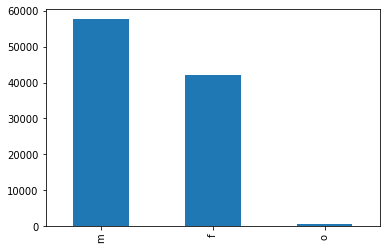

In [70]:
gender_data.gender.value_counts().plot(kind='bar')

In [71]:
gender_bin_data = gender_data[(gender_data['gender'] == 'm') | (gender_data['gender'] == 'f')]

In [72]:
gender_bin_data["gender"]

0         m
1         m
2         m
3         m
4         m
         ..
100530    m
100531    m
100532    m
100533    m
100534    m
Name: gender, Length: 99759, dtype: object

In [73]:
print("Happy moments written by male/female: {}".format(gender_bin_data['cleaned_hm'].size))

Happy moments written by male/female: 99759


In [74]:
gender_bin_data = gender_bin_data.assign(gender_bin=(np.where(gender_bin_data['gender']=='m', 1, 0)))

gender_bin_data.head()

,cleaned_hm,gender,gender_bin
0,I went on a successful date with someone I fel...,m,1
1,I played a new game that was fun and got to en...,m,1
2,I listened to some music and heard an entire a...,m,1
3,Went to see a movie with my friend,m,1
4,"Played guitar, learning a song on it",m,1


In [95]:
gender_bin_data.to_csv("gender_data.csv")

In [75]:
# I tried running the code in two ways. First, I tried running the whole data on the model and had to manually clear the RAM
# to get rid of memory issues. Second was i divided the data into batches but it turned out that using spark was a better option
# so i used spark instead for big data
hm_size = gender_bin_data['cleaned_hm'].size
# batch1= int(0.25 * gender_bin_data['cleaned_hm'].size)
# batch2= int(0.50 * gender_bin_data['cleaned_hm'].size)
# batch3= int(0.75 * gender_bin_data['cleaned_hm'].size)
batch= int(0.25 * gender_bin_data['cleaned_hm'].size)
num_train_hm = int(0.7 * gender_bin_data['cleaned_hm'].size)

train_hm = gender_bin_data.iloc[0:num_train_hm]

# train_hm1 = gender_bin_data.iloc[0:batch1]
# train_hm2 = gender_bin_data.iloc[batch1:batch2]
# train_hm3 = gender_bin_data.iloc[batch2:batch3]

test_hm = gender_bin_data.iloc[num_train_hm:hm_size]
# test_hm1 = gender_bin_data.iloc[batch3:hm_size]
# test_hm = test_hm.reset_index(drop=True)
# test_hm1= test_hm1.reset_index(drop=True)

# test_hm.head()

In [99]:
train_hm.to_csv("gender_train.csv")
test_hm.to_csv("gender_test.csv")


In [80]:
stopwords

['would',
 'out',
 'from',
 "i'm",
 'it',
 'do',
 "we'll",
 'he',
 'then',
 'be',
 'for',
 "shan't",
 'that',
 'just',
 'between',
 'else',
 'some',
 "she's",
 "i've",
 "couldn't",
 'through',
 'like',
 'am',
 'shall',
 'themselves',
 'ought',
 'over',
 'their',
 'in',
 'not',
 "where's",
 'an',
 'as',
 'other',
 'more',
 'our',
 'had',
 "they'll",
 'below',
 "mustn't",
 'were',
 'are',
 'by',
 'we',
 "don't",
 'its',
 'did',
 'where',
 'she',
 'could',
 'k',
 'have',
 "it's",
 'was',
 "weren't",
 'with',
 'few',
 "you're",
 'myself',
 'to',
 "won't",
 'but',
 "who's",
 'having',
 "why's",
 'at',
 'both',
 'ourselves',
 'http',
 'get',
 "how's",
 'than',
 'how',
 'any',
 "we've",
 'again',
 'no',
 'is',
 "you'd",
 'because',
 "hasn't",
 'when',
 "we'd",
 'theirs',
 'whom',
 'them',
 'above',
 'a',
 "they're",
 "when's",
 'who',
 'up',
 'his',
 'under',
 'himself',
 'the',
 'too',
 'nor',
 'very',
 "wasn't",
 'therefore',
 "wouldn't",
 "you'll",
 'into',
 'on',
 "you've",
 "doesn't",
 '

In [81]:
def clean_up_texts(hm_data):
    prepro_hm = []
#     stops = set(stopwords.words("english"))
    stops = set(stopwords)
    for i in range(0, hm_data['cleaned_hm'].size):
        letters = re.sub("[^a-zA-Z]", " ", hm_data.iloc[i]['cleaned_hm'])
        lower_words = letters.lower()
        # Tokenize the sentences
        tokens = lower_words.split()
        # Reconstruct the processed tokens into a string
        prepro_string = " ".join(tokens)
        prepro_hm.append(prepro_string)
    return prepro_hm
    
prepro_train = clean_up_texts(train_hm)
# prepro_train1 = clean_up_texts(train_hm1)
# prepro_train2= clean_up_texts(train_hm2)
# prepro_train3 = clean_up_texts(train_hm3)

prepro_test = clean_up_texts(test_hm)
# prepro_test1 = clean_up_texts(test_hm1)

print("Texts cleaned up! \n")

Texts cleaned up! 



In [96]:
prepro_train

['i went on a successful date with someone i felt sympathy and connection with',
 'i played a new game that was fun and got to enjoy the mechanics of it',
 'i listened to some music and heard an entire album i hadn t heard more than once before',
 'went to see a movie with my friend',
 'played guitar learning a song on it',
 'talked to my romantic prospect',
 'i played a game for about half an hour',
 'i discovered another album i hadn t heard by a band i recently got into',
 'i talked to the girl i m dating about some interesting topics',
 'i was happy when my son got marks in his examination',
 'i was very happy when my family brings me beautiful gift for me',
 'i was happy when i got my new incentives from my hardworking work',
 'when my family cooked my favorite food at night',
 'when my son got recovery from their disease',
 'when my mother got finalized stay for transfer in abroad',
 'when my family plan a abroad tour with me',
 'when my son realize their emotions and duty',
 'wh

In [105]:
# Saving train in a csv file for spark
label_train=[]
for i in range(num_train_hm):
    label_train.append(gender_bin_data.iloc[i]["gender_bin"])

In [106]:
# Saving test in a csv file for spark

label_test=[]
for i in range(num_train_hm,hm_size):
    label_test.append(gender_bin_data.iloc[i]["gender_bin"])
# num_train_hm:hm_size

In [110]:
save_train = pd.DataFrame(list(zip(prepro_train, label_train)), 
               columns =['data', 'gender_bin'])

In [112]:
save_train.to_csv("train.csv",index=False)

In [113]:
save_test = pd.DataFrame(list(zip(prepro_test, label_test)), 
               columns =['data', 'gender_bin'])

In [114]:
save_test.to_csv("test.csv",index=False)

In [82]:
vectorizer = CountVectorizer()

In [83]:
#Run it after manually clearing your RAM otherwise it will show memory error
features_train_hm = vectorizer.fit_transform(prepro_train)
# features_train_hm1 = vectorizer.fit_transform(prepro_train1)
# features_train_hm2 = vectorizer.fit_transform(prepro_train2)
# features_train_hm3 = vectorizer.fit_transform(prepro_train3)

In [118]:
#Run it after manually clearing your RAM otherwise it will show memory error
train_array_hm = features_train_hm.toarray()
# train_array_hm1 = features_train_hm1.toarray()
# train_array_hm2 = features_train_hm2.toarray()
# train_array_hm3 = features_train_hm3.toarray()

In [17]:
print("Dimension of the training data: {}".format(train_array_hm.shape))

Dimension of the training data: (59855, 19464)


In [18]:
train_array_hm

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [22]:
len(prepro_train)

59855

In [23]:
vocab = vectorizer.get_feature_names()

vocab[:20]

['aa',
 'aaa',
 'aadat',
 'aadhaar',
 'aadhar',
 'aagra',
 'aakshayatriya',
 'aas',
 'aashwin',
 'ab',
 'aback',
 'abacus',
 'abandon',
 'abandoned',
 'abasket',
 'abating',
 'abbott',
 'abby',
 'abc',
 'abcs']

In [24]:
# I tried running this multiple times but wasn't able to run it due to memory issues. 
#I had to manually clear my RAM and ran thi after that and got this result 
logi_model = LogisticRegression()
logi_model.fit(train_array_hm, train_hm['gender_bin'])
logi_model.score(test_array_hm, test_hm['gender_bin'])

C:\Users\mayan\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


0.7579817893242001

In [18]:
clf = svm.SVC()

In [117]:
# clf.partial_fit(train_array_hm1, train_hm1['gender_bin'])

In [116]:
# clf.fit(train_array_hm, train_hm['gender_bin'])

In [ ]:
clf.predict(train_array_hm, train_hm['gender_bin'])

In [21]:
gnb = GaussianNB()
y_pred = gnb.partial_fit(train_array_hm1, train_hm1['gender_bin'],classes=np.unique(train_hm1['gender_bin']))

In [23]:
y_pred.score(train_array_hm1, train_hm1['gender_bin'])

0.5488993143269578

In [115]:
# y_pred = gnb.partial_fit(train_array_hm2, train_hm2['gender_bin'],classes=np.unique(train_hm2['gender_bin']))

In [ ]:
y_pred.score(train_array_hm1, train_hm1['gender_bin'])

In [25]:
batch1

24939

In [27]:
batch2-batch1

24940

In [ ]:
#instead of dividing the texts into batches, divide the words into batches